## 3.2 Unsupervised Learning- Clustering
    
* ### Types of Clustering
https://towardsdatascience.com/6-types-of-clustering-methods-an-overview-7522dba026ca <br>
    
    * A. Centroid-based / Partitioning (K-means)
    * B. Connectivity-based (Agglomerative Hierarchical Clustering)
    * C. Density-based (Density-based spatial clustering of applications with noise, DBSCAN): 密度空間分群
    * D. Graph-based (Affinity Propagation)
    * E. Distribution-based (Gaussian Mixture Model, GMM)
    * F. Compression-based (Spectral Clustering, BIRCH)

* There are 2 types of clustering techniques:
    * Hard Clustering: A data point belongs to only one cluster. There is no overlap between clusters. For example - K-means clustering, Hierarchical clustering, etc.
    * Soft Clustering: A data point could belong to multiple clusters at the same time (with some weights/probabilities). There is an overlap between the clusters. For example — Weighted K-means and Gaussian Mixture Models(GMM).

In [ ]:
<div style="text-align: center;">
<img src="https://www.researchgate.net/publication/341205008/figure/fig1/AS:888500559835137@1588846449238/An-example-of-hard-and-soft-clustering-in-a-toy-example-containing-7-nodes-A-Hard.jpg" width="500"/>
</div>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

In [2]:
from sklearn.cluster import KMeans
from sklearn.decomposition import NMF, PCA

### DataSet 1: makemoon 

In [3]:
from sklearn.datasets import make_moons
#--- Make two interleaving half circles 2個交錯的半圓型 (半月狀)
def mkMoons(nnoise=0.1, nCount=1000, nfig=0):
    X, y = make_moons(noise=nnoise, n_samples=nCount)
    plt.figure(figsize=(5, 4), dpi=60)
    sns.scatterplot(
        x=X[:, 0], y=X[:, 1], hue=y,
        marker='o', s=25, edgecolor='k', legend=False
        ).set_title('make_moons noise '+str(nnoise))
    plt.savefig('moon'+str(nfig)+'.jpg')
    plt.show()
    return X, y

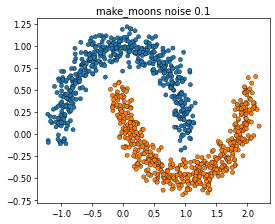

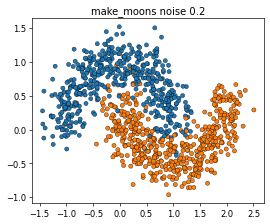

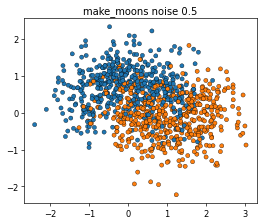

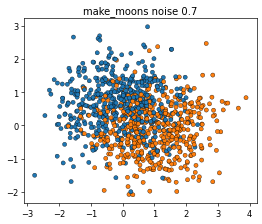

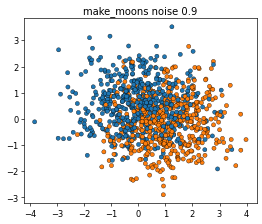

In [4]:
#--- call function
distance = [0.1, 0.2, 0.5, 0.7, 0.9]
k = 0
for d in distance:
    mkMoons(d, 1000, k)
    k += 1

### DataSet 2: people 

In [5]:
from sklearn.datasets import fetch_lfw_people
people = fetch_lfw_people(min_faces_per_person=7, resize=0.7)
image_shape = people.images[0].shape

mask = np.zeros(people.target.shape, dtype=np.bool_)
for target in np.unique(people.target):
    mask[np.where(people.target == target)[0][:50]] = 1
    
X_people = people.data[mask]
y_people = people.target[mask]

# scale the grey-scale values to be between 0 and 1
# instead of 0 and 255 for better numeric stability:
X_people = X_people / 255.

X_train, X_test, y_train, y_test = train_test_split(
    X_people, y_people, stratify=y_people, random_state=0)

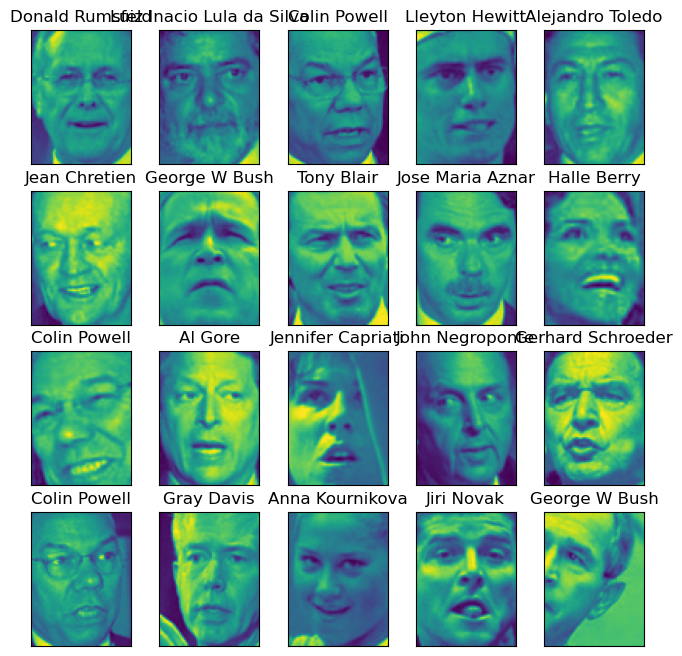

In [6]:
fig, axes = plt.subplots(4, 5, figsize=(8, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for target, image, ax in zip(people.target, people.images, axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])

<hr style="border:2px solid green">

### A. K-Means Clustering

* Step 1: First select a number of classes/groups to use and randomly initialize their respective center points. To figure out the number of classes to use, it’s good to take a quick look at the data and try to identify any distinct groupings. The center points are vectors of the same length as each data point vector and are the “X’s” in the graphic above.
* Step 2: Each data point is classified by computing the distance between that point and each group center, and then classifying the point to be in the group whose center is closest to it.
* Step 3: Based on these classified points, we recompute the group center by taking the mean of all the vectors in the group.
* Step 4: Repeat these steps for a set number of iterations or until the group centers don’t change much between iterations. You can also opt to randomly initialize the group centers a few times, and then select the run that looks like it provided the best results.

<div>
<img src="https://miro.medium.com/v2/resize:fit:640/1*KrcZK0xYgTa4qFrVr0fO2w.gif" width="400"/>
</div>

* The proximity between data points to the centroid is measured by

    * Euclidean distance: Shortest (straight-line) distance, useful for numerical features, this is the default distance measure
    * Manhattan distance: Sum of absolute differences, useful for categorical features
    * Hamming distance: Percentage of bits that differ, useful for binary features
    * Mahalanobis distance: Standardised form of Euclidean distance
    * Minkowski distance: Generalized form of Euclidean and Manhattan distance
    * Chebyshev distance: Maximum absolute difference

Cluster memberships:
[0 1 1 0 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 1 1 0 0 1 1 1 1 0 1 1 1 0 0 0
 0 0 1 1 1 0 0 1 0 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0 0 1
 1 1 0 1 1 1 0 0 1 0 0 0 0 1 1 1 1 0 0 1 1 1 1 1 0 0]


c:\Users\hao\anaconda3\envs\Python11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


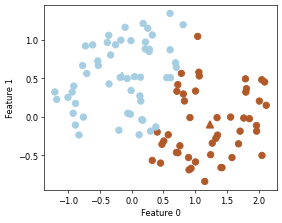

In [7]:
X, y = make_moons(n_samples=100, noise=0.2, random_state=0)

kmeans = KMeans(n_clusters=2, random_state=0)
kmeans.fit(X)
y_pred = kmeans.predict(X)

plt.figure(figsize=(5, 4), dpi=60)
plt.scatter(X[:, 0], X[:, 1], c=y_pred, s=60, cmap='Paired')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=60,
            marker='^', c=range(kmeans.n_clusters), linewidth=2, cmap='Paired')
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")
print("Cluster memberships:\n{}".format(y_pred))

In [8]:
distance_features = kmeans.transform(X)
print("Distance feature shape: {}".format(distance_features.shape))
print("Distance features:\n{}".format(distance_features))

Distance feature shape: (100, 2)
Distance features:
[[0.47859366 1.65359107]
 [2.2135504  0.73333653]
 [1.19808899 0.32804001]
 [0.51227408 1.26129698]
 [1.48899802 0.54473423]
 [2.20204245 1.0023202 ]
 [0.70355617 0.9135939 ]
 [1.61835208 0.64233082]
 [0.23562187 1.31919775]
 [1.96146224 0.70478134]
 [0.03510751 1.54023786]
 [2.23758336 0.74000759]
 [1.95935951 0.58395194]
 [1.2975286  1.15983017]
 [0.7628188  0.8697813 ]
 [0.56713263 1.96975521]
 [0.73964418 1.58804604]
 [0.50530171 1.41540266]
 [0.32647263 1.80669329]
 [1.21665736 0.65247636]
 [0.55724471 2.05086736]
 [0.91403634 0.8369937 ]
 [0.93475051 0.80243701]
 [1.32920233 0.62370027]
 [0.81094744 1.99773559]
 [1.02412263 2.06912877]
 [0.88603363 0.67690876]
 [2.30320409 0.92111322]
 [1.99417957 0.53974446]
 [1.68922293 0.18214047]
 [0.84972481 0.85263192]
 [1.88983057 0.74289179]
 [2.08188075 0.62635076]
 [1.08694001 0.79850869]
 [0.19733358 1.34040475]
 [0.46548838 1.77999306]
 [0.57369178 1.47602336]
 [0.43993994 1.1308975 

##### Vector Quantization - Or Seeing k-Means as Decomposition

In [9]:
kmeans = KMeans(n_clusters=20, random_state=0)
kmeans.fit(X_train)

pca = PCA(n_components=20, random_state=0)
pca.fit(X_train)

nmf = NMF(n_components=20, random_state=0)
nmf.fit(X_train)

X_reconstructed_pca = pca.inverse_transform(pca.transform(X_test))
X_reconstructed_kmeans = kmeans.cluster_centers_[kmeans.predict(X_test)]
X_reconstructed_nmf = np.dot(nmf.transform(X_test), nmf.components_)

c:\Users\hao\anaconda3\envs\Python11\Lib\site-packages\sklearn\decomposition\_nmf.py:1759: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


Text(0, 0.5, 'nmf')

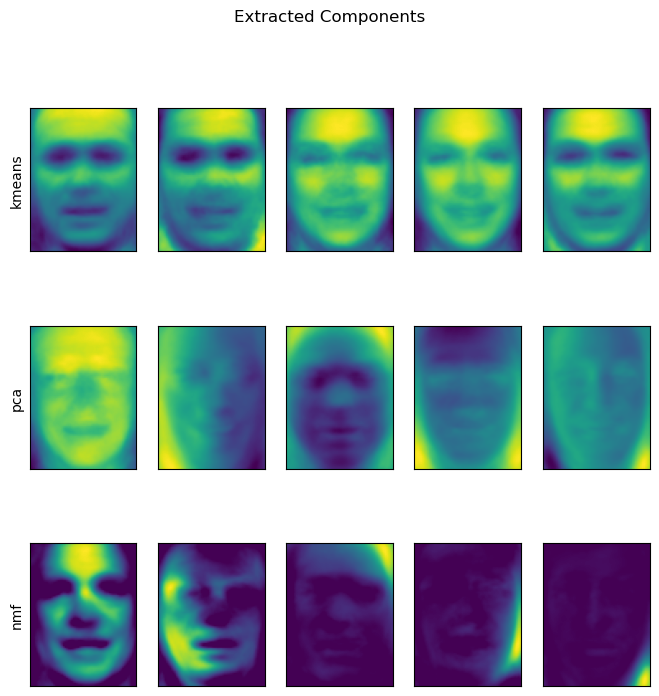

In [10]:
fig, axes = plt.subplots(3, 5, figsize=(8, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

fig.suptitle("Extracted Components")
# Take top 5 images from 
for ax, comp_kmeans, comp_pca, comp_nmf in zip(
        axes.T, kmeans.cluster_centers_, pca.components_, nmf.components_):
   # print(f'comp_kmeans is {comp_kmeans}')
    ax[0].imshow(comp_kmeans.reshape(image_shape))
    ax[1].imshow(comp_pca.reshape(image_shape), cmap='viridis')
    ax[2].imshow(comp_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("kmeans")
axes[1, 0].set_ylabel("pca")
axes[2, 0].set_ylabel("nmf")

Text(0, 0.5, 'nmf')

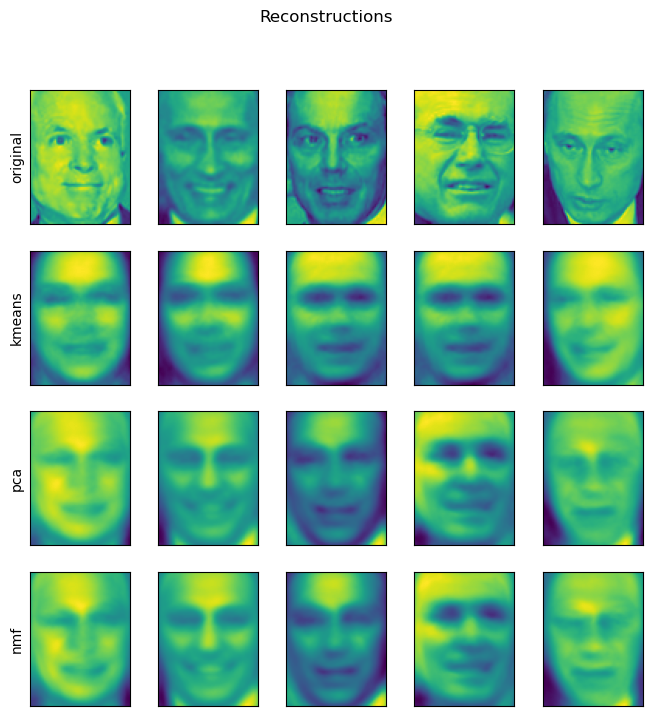

In [11]:
fig, axes = plt.subplots(4, 5, figsize=(8, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

fig.suptitle("Reconstructions")
for ax, orig, rec_kmeans, rec_pca, rec_nmf in zip(
        axes.T, X_test, X_reconstructed_kmeans, X_reconstructed_pca,
        X_reconstructed_nmf):

    ax[0].imshow(orig.reshape(image_shape))
    ax[1].imshow(rec_kmeans.reshape(image_shape))
    ax[2].imshow(rec_pca.reshape(image_shape))
    ax[3].imshow(rec_nmf.reshape(image_shape))

axes[0, 0].set_ylabel("original")
axes[1, 0].set_ylabel("kmeans")
axes[2, 0].set_ylabel("pca")
axes[3, 0].set_ylabel("nmf")

<hr style="border:2px solid green">

### B. Agglomerative Hierarchical Clustering (聚合式階層分群法）由樹狀結構的底部開始層層聚合

* Hierarchical clustering algorithms group similar objects into groups called clusters. There are two types of hierarchical clustering algorithms:

* Agglomerative — Bottom up approach. Start with many small clusters and merge them together to create bigger clusters.
* Divisive — Top down approach. Start with a single cluster than break it up into smaller clusters.

* Steps to agglomerative hierarchical clustering

    * Step 1: Preparing the data
    * Step 2: Computing (dis)similarity information between every pair of objects in the data set.
    * Step 3: Using linkage function to group objects into hierarchical cluster tree, based on the distance information generated at step 1. Objects/clusters that are in close proximity are linked together using the linkage function.
    * Step 4: Determining where to cut the hierarchical tree into clusters. This creates a partition of the data.

#### Ward Hierarchical Clustering (群與群之間的距離)
It minimizes the total within-cluster variance. At each step the pair of clusters with minimum between-cluster distance are merged. <br>
If there exist two clusters $C_1$ and $C_2$, the distance of two clusters is  

\begin{equation}
\begin{split}
d(C_1, C_2) = \sum_{a \in {C_1 \cup C_2}} \Vert a - u_{C_1 \cup C_2} \Vert
\end{split}. \tag{B.1}
\end{equation}

where $u$ denotes the averages of clusters $C_1$ and $C_2$

<div style="text-align: center;">
<img src="https://miro.medium.com/v2/resize:fit:1400/1*ET8kCcPpr893vNZFs8j4xg.gif" width="600"/>
</div>

Dendrograms
* We can use a dendrogram to visualize the history of groupings and figure out the optimal number of clusters.

    * Determine the largest vertical distance that doesn’t intersect any of the other clusters
    * Draw a horizontal line at both extremities
    * The optimal number of clusters is equal to the number of vertical lines going through the horizontal line

* Some pros and cons of Hierarchical Clustering
* Pros
    * No assumption of a particular number of clusters (i.e. k-means)
    * May correspond to meaningful taxonomies
* Cons
    * Once a decision is made to combine two clusters, it can’t be undone
    * Too slow for large data sets, O(𝑛2 log(𝑛))

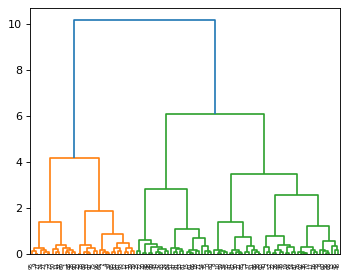

In [12]:
# Import the dendrogram function and the ward clustering function from SciPy
from scipy.cluster.hierarchy import dendrogram, ward

X, y = make_moons(n_samples=100, noise=0.1, random_state=0)
# Apply the ward clustering to the data array X
# The SciPy ward function returns an array that specifies the distances
# bridged when performing agglomerative clustering
linkage_array = ward(X)

# Now we plot the dendrogram for the linkage_array containing the distances # between clusters
plt.figure(figsize=(5, 4), dpi=80)
dendrogram(linkage_array)
plt.show()

Text(0, 0.5, 'Cluster distance')

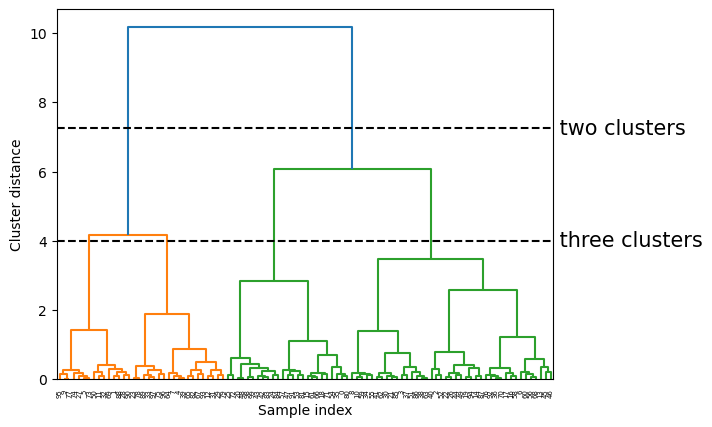

In [13]:
# mark the cuts in the tree that signify two or three clusters
dendrogram(linkage_array)

ax = plt.gca()
bounds = ax.get_xbound()
ax.plot(bounds, [7.25, 7.25], '--', c='k')
ax.plot(bounds, [4, 4], '--', c='k')

ax.text(bounds[1], 7.25, ' two clusters', va='center', fontdict={'size': 15})
ax.text(bounds[1], 4, ' three clusters', va='center', fontdict={'size': 15})
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

<hr style="border:2px solid green">

### C. DBSCAN (Density-based spatial clustering of applications with noise): 密度空間分群

* BSCAN will start from any point by itself. In the following figure, it is assumed to start from A and then search for the "data quantity" within the eps($\epsilon$) range around A. 
* When there are more than min_samples data in the current $\epsilon$ range, we consider A to be a Core and then start to do the same thing for other data within the ($\epsilon$) range of A, until now we stop when there is no point with the number of min_samples within the eps range of a certain point.

* And if the starting point today is N, there will not be enough points around at the very beginning so that N will be judged as Noise.

* Input: sample set $D={x_1, x_2,..,x_n}$, the neighborhood parameter $(\epsilon, MinPts)$

#### Step 1: 
DBSCAN begins with an arbitrary starting data point that has not been visited. The neighborhood of this point is extracted using a distance epsilon ε (All points which are within the ε distance are neighborhood points).

#### Step 2:
If there are a sufficient number of points (according to minPoints) within this neighborhood then the clustering process starts and the current data point becomes the first point in the new cluster. 
        Otherwise, the point will be labeled as noise (later this noisy point might become the part of the cluster). In both cases that point is marked as “visited”. <br>

#### Step 3: 
For this first point in the new cluster, the points within its ε distance neighborhood also become part of the same cluster. 
        This procedure of making all points in the ε neighborhood belong to the same cluster is then repeated for all of the new points that have been just added to the cluster group.
   
#### Step 4: 
This process of steps 2 and 3 is repeated until all points in the cluster are determined i.e all points within the ε neighborhood of the cluster have been visited and labeled.

#### Step 5: 
Once we’re done with the current cluster, a new unvisited point is retrieved and processed, leading to the discovery of a further cluster or noise. This process repeats until all points are marked as visited. Since at the end of this all points have been visited, each point will have been marked as either belonging to a cluster or being noise.

<div style="text-align: center;">
<img src="https://miro.medium.com/v2/resize:fit:750/1*tc8UF-h0nQqUfLC8-0uInQ.gif" width="400"/>
</div>

* Hyperparameter:
    * eps: 各點「要搜尋的周圍範圍」, noise太多 ==> 加大eps，縮小min_sample
    * min_samples:，一個範圍內「有多少個點以上」才算密度夠高; noise 少  ==> 加大min_sample，縮小eps
    * metric: <default> L2-distance, or named Euclidean Distance, or Cosine similarity for embedding of NLP

Text(0, 0.5, 'Feature 1')

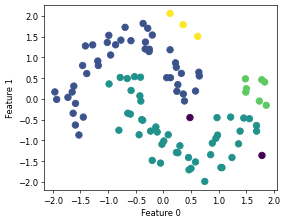

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN

X, y = make_moons(n_samples=100, noise=0.2, random_state=0)

# Rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

dbscan = DBSCAN(eps=0.4, min_samples=3)
clusters = dbscan.fit_predict(X_scaled)
# plot the cluster assignments
plt.figure(figsize=(5, 4), dpi=60)
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c = clusters, cmap='viridis', s=60)
plt.xlabel("Feature 0")
plt.ylabel("Feature 1")

##### Comparing and evaluating clustering algorithms
##### Evaluating clustering with ground truth

c:\Users\hao\anaconda3\envs\Python11\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


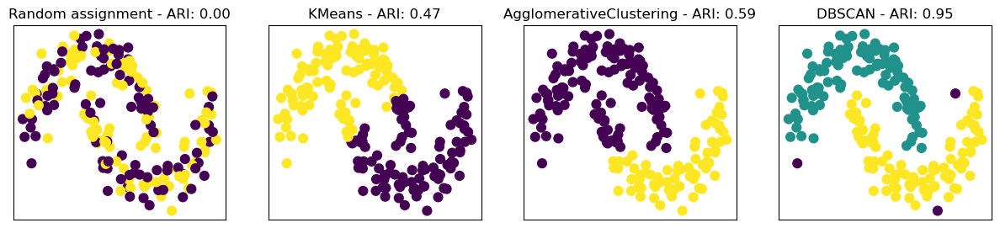

In [26]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.cluster import adjusted_rand_score
X, y = make_moons(n_samples=200, noise=0.12, random_state=0)

# Rescale the data to zero mean and unit variance
scaler = StandardScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)

fig, axes = plt.subplots(1, 4, figsize=(15, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})

# make a list of algorithms to use
algorithms = [KMeans(n_clusters=2), AgglomerativeClustering(n_clusters=2), DBSCAN(eps=0.3, min_samples=3)]

# create a random cluster assignment for reference
random_state = np.random.RandomState(seed=0)
random_clusters = random_state.randint(low=0, high=2, size=len(X))

# plot random assignment
axes[0].scatter(X_scaled[:, 0], X_scaled[:, 1], c=random_clusters, cmap='viridis', s=60)
axes[0].set_title("Random assignment - ARI: {:.2f}".format(
        adjusted_rand_score(y, random_clusters)))

for ax, algorithm in zip(axes[1:], algorithms):
    # plot the cluster assignments and cluster centers
    clusters = algorithm.fit_predict(X_scaled)
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], c=clusters, cmap='viridis', s=60)
    ax.set_title("{} - ARI: {:.2f}".format(algorithm.__class__.__name__,
                                           adjusted_rand_score(y, clusters)))

In [27]:
from sklearn.metrics import accuracy_score

# these two labelings of points correspond to the same clustering
clusters1 = [0, 0, 1, 1, 0]
clusters2 = [1, 1, 0, 0, 1]
# accuracy is zero, as none of the labels are the same
print("Accuracy: {:.2f}".format(accuracy_score(clusters1, clusters2)))
# adjusted rand score is 1, as the clustering is exactly the same:
print("ARI: {:.2f}".format(adjusted_rand_score(clusters1, clusters2)))

Accuracy: 0.00
ARI: 1.00


##### Evaluating clustering without ground truth

#### C.1 DBSCAN based on PCA 

In [28]:
# extract eigenfaces from lfw data and transform data
pca = PCA(n_components=100, whiten=True, random_state=0)
X_pca = pca.fit_transform(X_people)

In [29]:
# apply DBSCAN with default parameters
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print(f"Unique labels: {np.unique(labels)}")

Unique labels: [-1]


In [30]:
dbscan = DBSCAN(min_samples=3)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


In [31]:
dbscan = DBSCAN(min_samples=3, eps=15)
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1  0]


In [32]:
# count number of points in all clusters and noise.
# bincount doesn't allow negative numbers, so we need to add 1.
# the first number in the result corresponds to noise points
print("Number of points per cluster: {}".format(np.bincount(labels + 1)))

Number of points per cluster: [  50 4085]


##### Analyzing the faces dataset with DBSCAN

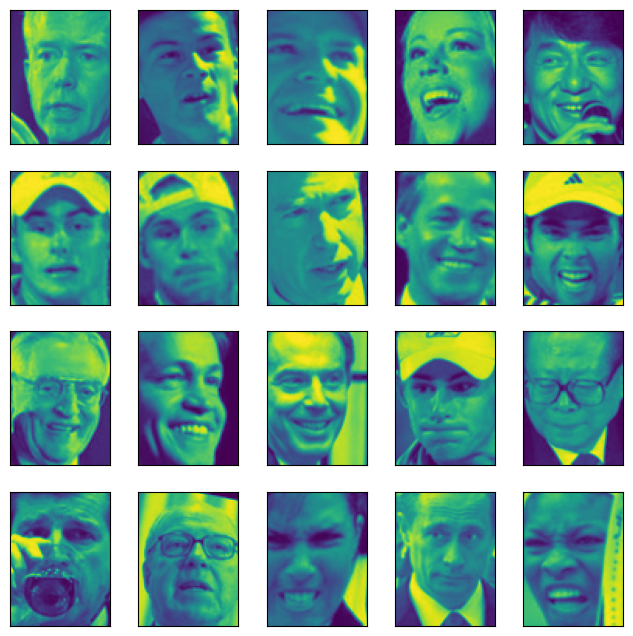

In [33]:
noise = X_people[labels==-1]
fig, axes = plt.subplots(4, 5, figsize=(8, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for image, ax in zip(noise, axes.ravel()):
    ax.imshow(image.reshape(image_shape)*255, vmin=0, vmax=1)

In [34]:
for eps in [1, 3, 5, 7, 9, 11, 13]:
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=1
Number of clusters: 1
Cluster sizes: [4135]

eps=3
Number of clusters: 1
Cluster sizes: [4135]

eps=5
Number of clusters: 2
Cluster sizes: [4131    4]

eps=7
Number of clusters: 8
Cluster sizes: [3835  281    4    3    3    3    3    3]

eps=9
Number of clusters: 3
Cluster sizes: [2233 1898    4]

eps=11
Number of clusters: 2
Cluster sizes: [ 747 3388]

eps=13
Number of clusters: 2
Cluster sizes: [ 214 3921]


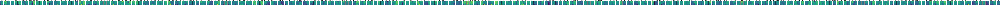

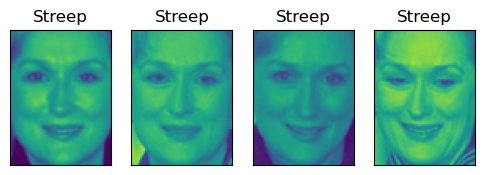

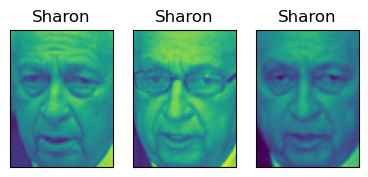

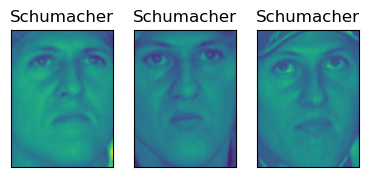

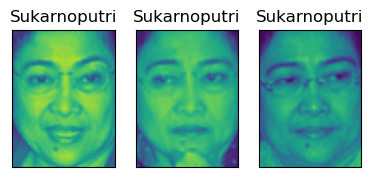

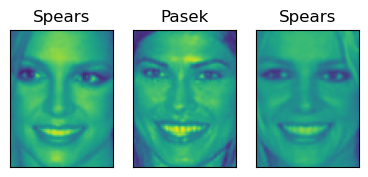

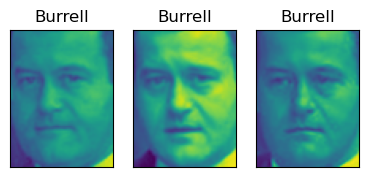

In [35]:
dbscan = DBSCAN(min_samples=3, eps=7)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images =  np.sum(mask)
    fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4),
                             subplot_kw={'xticks': (), 'yticks': ()})
    for image, label, ax in zip(X_people[mask], y_people[mask], axes):

        ax.imshow(image.reshape(image_shape)*255, vmin=0, vmax=1)
        ax.set_title(people.target_names[label].split()[-1])

#### C.2 Analyzing the faces dataset with k-Means

In [36]:
# extract clusters with k-Means
km = KMeans(n_clusters=10, random_state=0)
labels_km = km.fit_predict(X_pca)
print("Cluster sizes k-means: {}".format(np.bincount(labels_km)))

Cluster sizes k-means: [245 432 449 357 446 656 609 251 360 330]


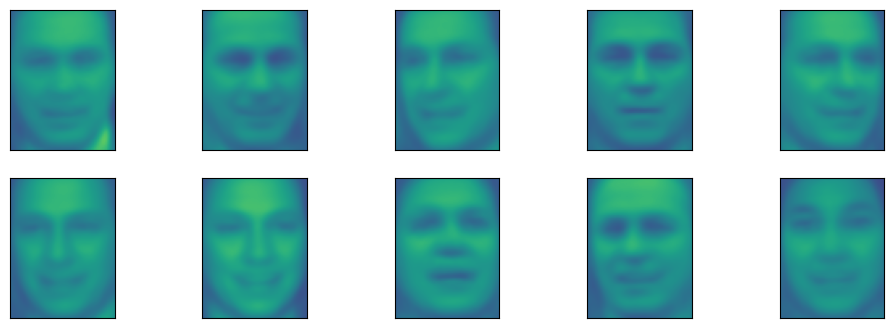

In [37]:
fig, axes = plt.subplots(2, 5, subplot_kw={'xticks': (), 'yticks': ()},
                         figsize=(12, 4))

for center, ax in zip(km.cluster_centers_, axes.ravel()):
    ax.imshow(pca.inverse_transform(center).reshape(image_shape)*255,
              vmin=0, vmax=1)

#### C.3 Analyzing the faces dataset with agglomerative clustering

In [38]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=10)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(
       np.bincount(labels_agg)))

cluster sizes agglomerative clustering: [1763  446  355  529  185  353  181  106  205   12]


In [39]:
print("ARI: {:.2f}".format(adjusted_rand_score(labels_agg, labels_km)))

ARI: 0.10


Text(0, 0.5, 'Cluster distance')

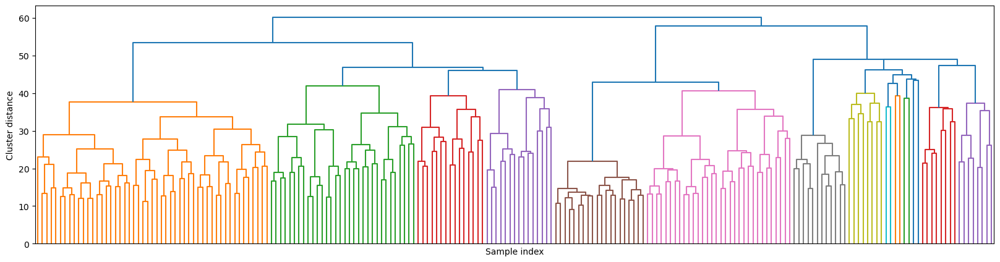

In [40]:
linkage_array = ward(X_pca)
# now we plot the dendrogram for the linkage_array
# containing the distances between clusters
plt.figure(figsize=(20, 5))
dendrogram(linkage_array, p=7, truncate_mode='level', no_labels=True)
plt.xlabel("Sample index")
plt.ylabel("Cluster distance")

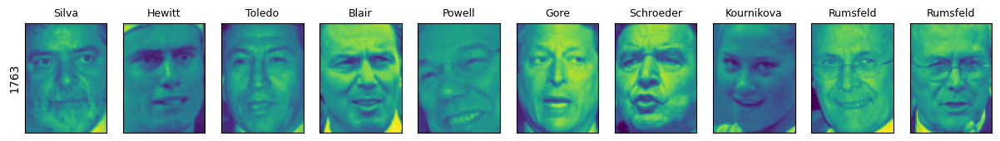

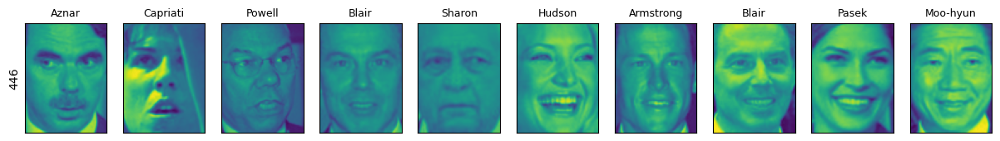

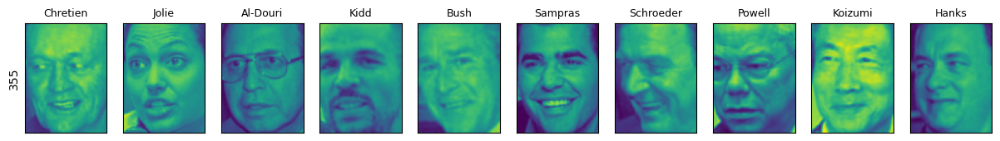

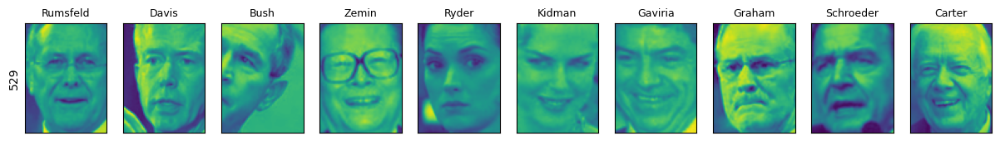

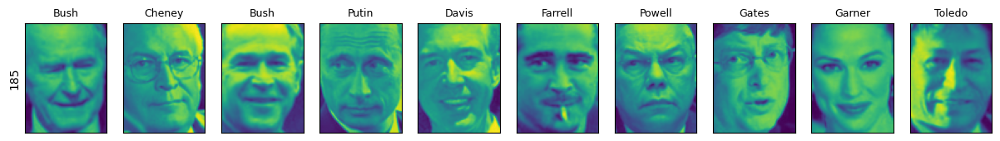

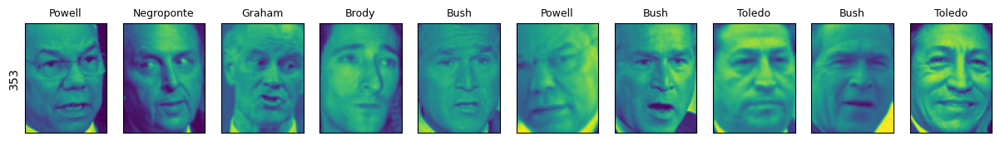

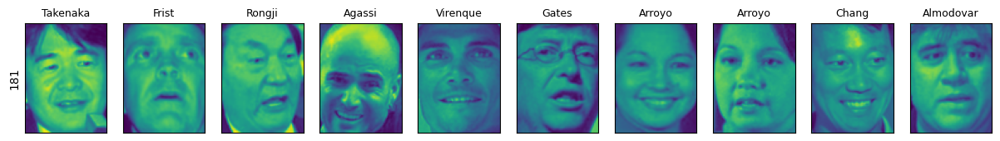

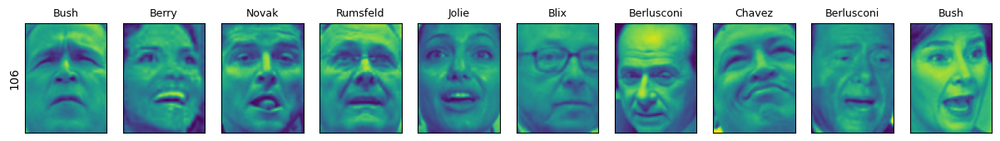

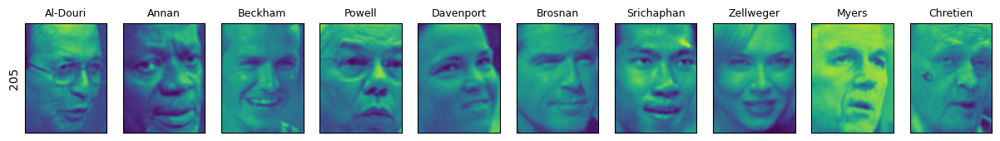

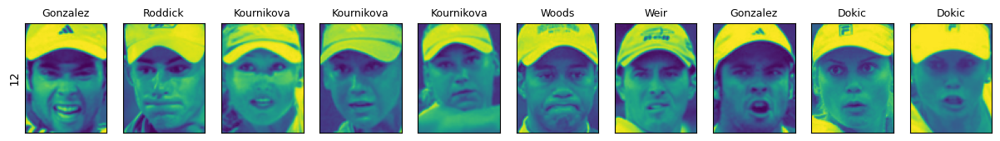

In [41]:
n_clusters = 10
for cluster in range(n_clusters):
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 10, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    axes[0].set_ylabel(np.sum(mask))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape)*255, vmin=0, vmax=1)
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})

cluster sizes agglomerative clustering: [124 198 182 153 103 106 247 168 235  71 168 131 162  65 211 127  86 222
 111  12  48  66  85  52  34  36  56  35 163   5  21  39  75  11  69  53
  13  37 247 108]


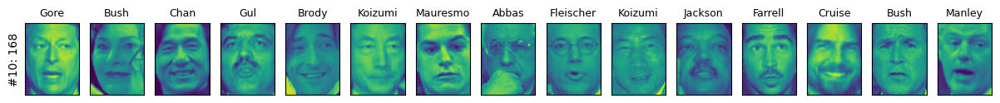

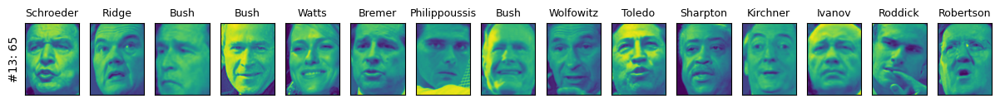

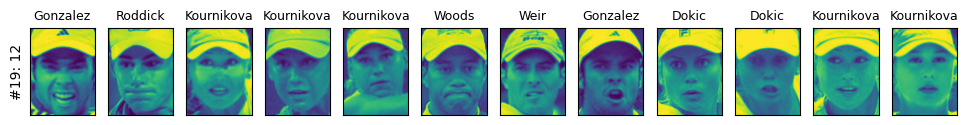

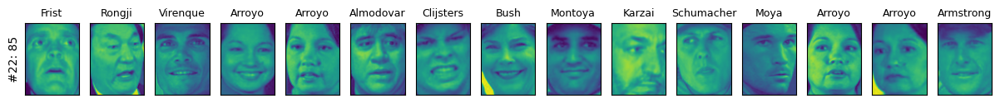

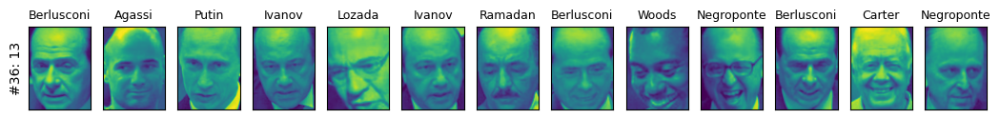

In [42]:
# extract clusters with ward agglomerative clustering
agglomerative = AgglomerativeClustering(n_clusters=40)
labels_agg = agglomerative.fit_predict(X_pca)
print("cluster sizes agglomerative clustering: {}".format(np.bincount(labels_agg)))

n_clusters = 40
for cluster in [10, 13, 19, 22, 36]: # hand-picked "interesting" clusters
    mask = labels_agg == cluster
    fig, axes = plt.subplots(1, 15, subplot_kw={'xticks': (), 'yticks': ()},
                             figsize=(15, 8))
    cluster_size = np.sum(mask)
    axes[0].set_ylabel("#{}: {}".format(cluster, cluster_size))
    for image, label, asdf, ax in zip(X_people[mask], y_people[mask],
                                      labels_agg[mask], axes):
        ax.imshow(image.reshape(image_shape)*255, vmin=0, vmax=1)
        ax.set_title(people.target_names[label].split()[-1],
                     fontdict={'fontsize': 9})
    for i in range(cluster_size, 15):
        axes[i].set_visible(False)

<hr style="border:2px solid green">

### E. Gussian Mixture Model (GMM)
* Gaussian Mixture Models(GMM) are the probabilistic way of doing soft clustering. <br>
Each data point is assigned to multiple clusters with different probabilities.
* Clusters created by the Gaussian Mixture Model follow a gaussian (normal) probability distribution.
* To construct any distribution, we need some underlying parameters. For constructing the Gaussian distribution, we need to find the mean and variance of the distribution. This is where the Expectation Maximization(EM) algorithm does the trick.

* GMM assumes that every data point is generated from multiple Gaussian distributions with unknown parameters and performs iterative Expectation Maximization (EM) steps to fit the data points.
* In the Expectation (E) step, data points are assigned to clusters that assume randomly selected Gaussian parameters. In the Maximization (M) step, the parameters of the Gaussian distribution are updated to best fit the data points in the cluster.

<div style="text-align: center;">
<img src="https://miro.medium.com/v2/resize:fit:786/1*I0WTzTOyyDVwfPyMSZPzWQ.gif" width="400"/>
</div>

### Gaussian Mixture Models Implementation:

http://localhost:8888/notebooks/Machine%20Learning%20with%20Application/3.%20Unsupervised%20Learning/GMM_Implementation.ipynb

https://scikit-learn.org/stable/auto_examples/cluster/plot_cluster_comparison.html#sphx-glr-auto-examples-cluster-plot-cluster-comparison-py